<a href="https://colab.research.google.com/github/r6chow/IDC_Histopathology/blob/master/ExploratoryAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install spams

# Libraries

In [0]:
import os
from google.colab import drive
import numpy as np
import pickle
#import imageio  #for reading images
#import cv2
from PIL import Image, ImageOps
import matplotlib.pyplot as plt

import spams

import time

# Load Images

In [3]:
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
binary_fldr = '/content/drive/Shared drives/Roger Chow/Dataset/IDC_regular_ps50_idx5_BIN/'
bin_file =  'IDC_regular_ps50_idx5.p'
images = pickle.load(open(binary_fldr + bin_file, 'rb'))


In [0]:
# binary_fldr = '/content/drive/My Drive/IDC_regular_ps50_idx5_BIN/'

# len(os.listdir(binary_fldr))


In [0]:
# bin_files = os.listdir(binary_fldr)

# images = []
# for bin_file in bin_files:
#   #print (binary_fldr + bin_file)
#   #image_load = np.load(binary_fldr + file)
#   image_load = pickle.load( open( binary_fldr + bin_file, "rb" ) )
#   images += image_load

In [7]:
len(images)

277524

In [8]:
images[0]

{'class': '0',
 'file': '12893_idx5_x1001_y1101_class0.png',
 'id': '12893',
 'img': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=50x50 at 0x7FA0408902E8>,
 'x': 1001,
 'y': 1101}

# About the Images

## Distribution of Cancer/Non-Cancer patches


([<matplotlib.patches.Wedge at 0x7fa028542c18>,
 [Text(0.6907591564470219, 0.8560676303800997, 'cancer'),
  Text(-0.6907590762961828, -0.8560676950536357, 'non-cancer')])

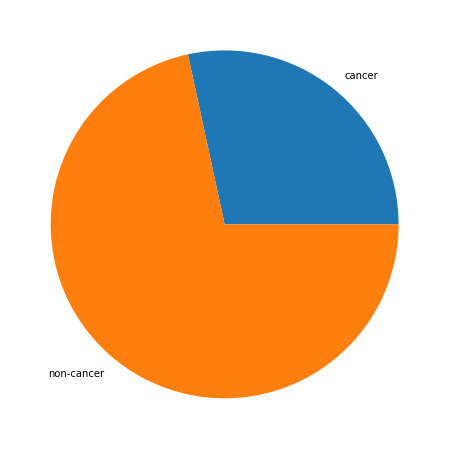

In [9]:
num_cancer = len([img for img in images if img['class'] == '1'])
num_non_cancer = len([img for img in images if img['class'] == '0'])

fig = plt.figure(figsize=(8,8))
plt.pie(x=[num_cancer, num_non_cancer], labels=['cancer', 'non-cancer'])

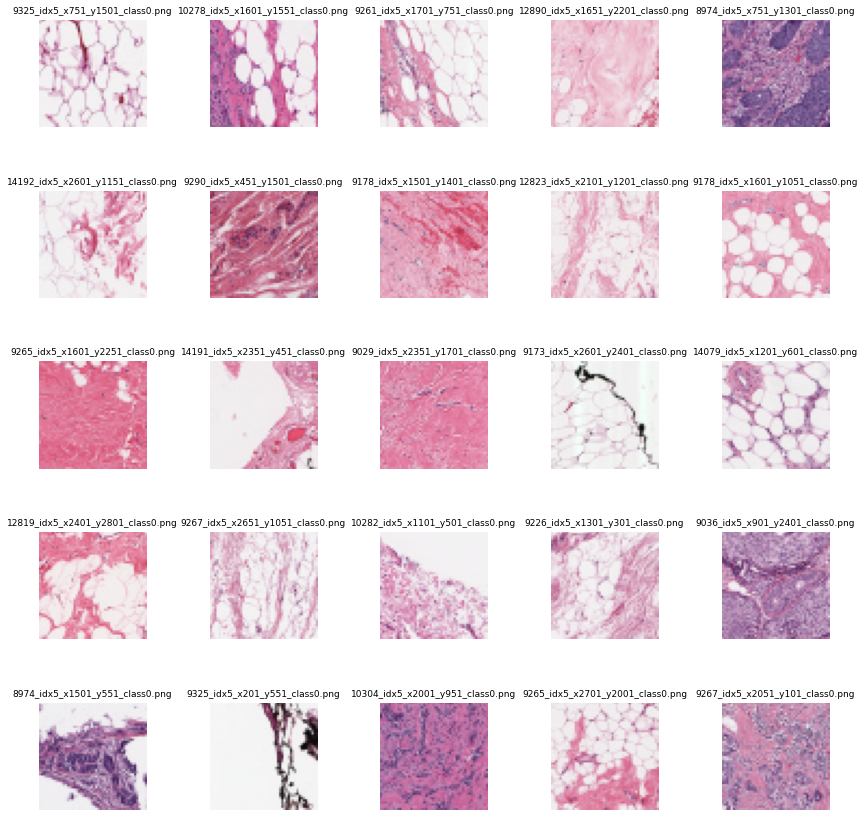

In [10]:
result_images = [img for img in images if img['class'] == '0']

rdm_size = 25
num_fig = 5
#view random images
rdm_idx_list =  np.random.choice(range(len(result_images)), rdm_size, replace=False)

fig, axes = plt.subplots(num_fig, num_fig, figsize=(12,12))

for i in range(len(rdm_idx_list)):

  col = i % num_fig
  row = int(i / num_fig) 

  idx = rdm_idx_list[i]
  axes[row][col].set_title(result_images[idx]['file'], fontsize=9 )
  axes[row][col].imshow(result_images[idx]['img'])
  axes[row][col].axis('off')

plt.tight_layout()

## Viewing random patches

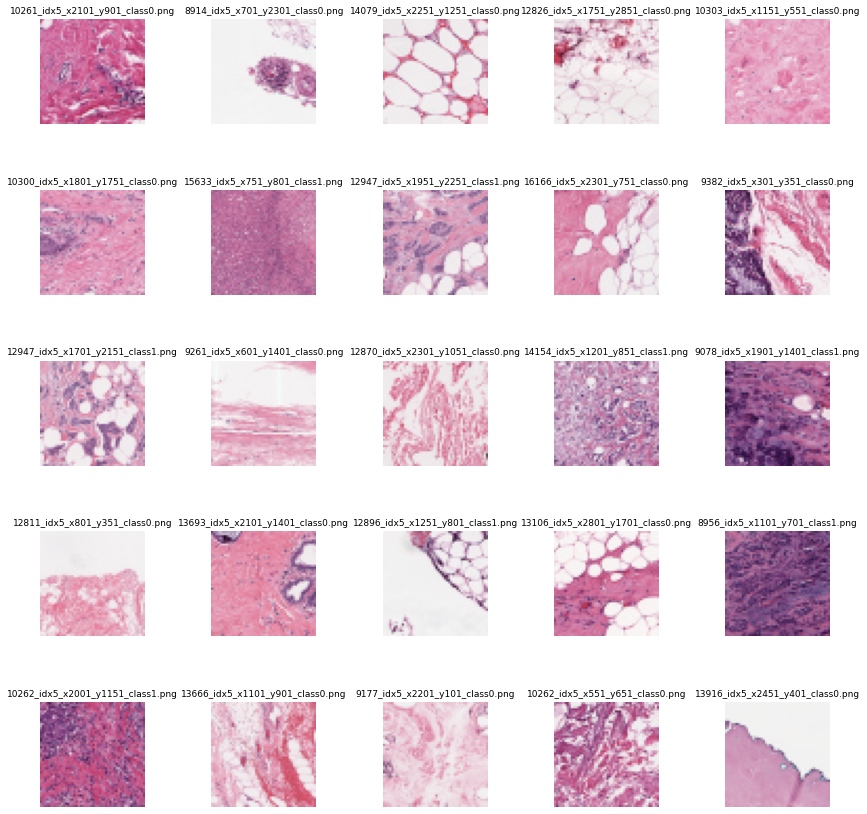

In [11]:
rdm_size = 25
num_fig = 5
#view random images
np.random.seed(1)
rdm_idx_list =  np.random.choice(range(len(images)), rdm_size, replace=False)

fig, axes = plt.subplots(num_fig, num_fig, figsize=(12,12))

for i in range(len(rdm_idx_list)):

  col = i % num_fig
  row = int(i / num_fig) 

  idx = rdm_idx_list[i]
  axes[row][col].set_title(images[idx]['file'], fontsize=9 )
  axes[row][col].imshow(images[idx]['img'])
  axes[row][col].axis('off')

plt.tight_layout()

## Viewing Cancer Patches

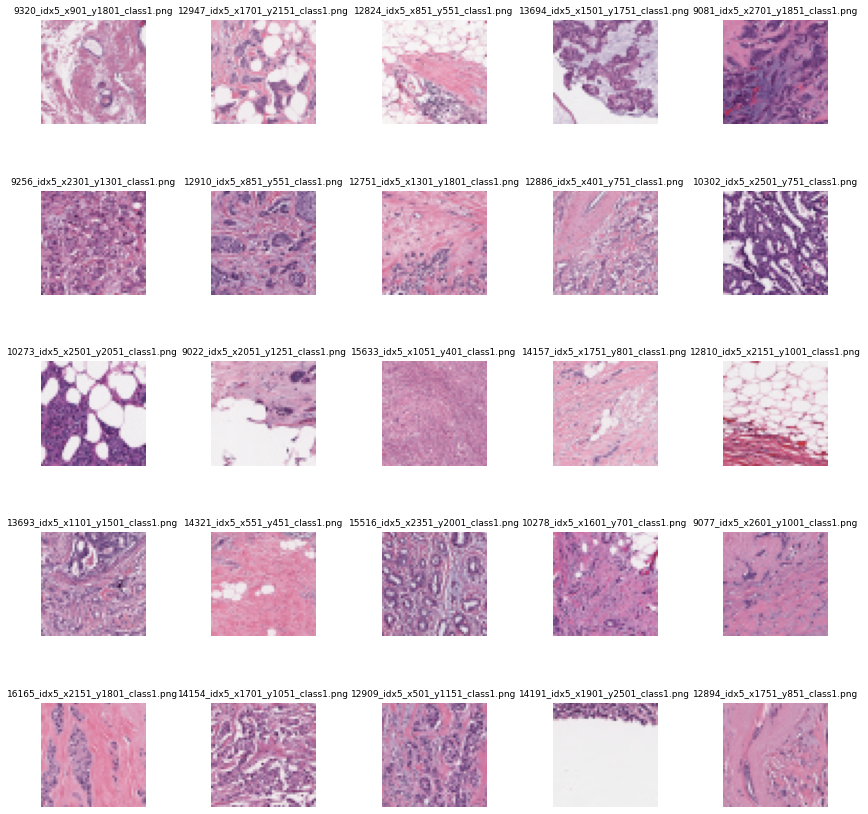

In [12]:
result_images = [img for img in images if img['class'] == '1']

rdm_size = 25
num_fig = 5
#view random images
rdm_idx_list =  np.random.choice(range(len(result_images)), rdm_size, replace=False)

fig, axes = plt.subplots(num_fig, num_fig, figsize=(12,12))

for i in range(len(rdm_idx_list)):

  col = i % num_fig
  row = int(i / num_fig) 

  idx = rdm_idx_list[i]
  axes[row][col].set_title(result_images[idx]['file'], fontsize=9 )
  axes[row][col].imshow(result_images[idx]['img'])
  axes[row][col].axis('off')

plt.tight_layout()

##Viewing Non-Cancer Patch

# View Slide

In [13]:
import re
m = re.match('([0-9]+)_idx5_x([0-d]+)_y([0-9]+).*', '9023_idx5_x1001_y1201_class0.png')
m.group(1,2,3)

('9023', '1001', '1201')

In [14]:

#extract additional metadata from file
for img in images:
  m = re.match('([0-9]+)_idx5_x([0-d]+)_y([0-9]+).*', img['file'])
  img['id'] = m.group(1)
  img['x'] =  int(m.group(2))
  img['y'] =  int(m.group(3))
  
images[0:3]

[{'class': '0',
  'file': '12893_idx5_x1001_y1101_class0.png',
  'id': '12893',
  'img': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=50x50 at 0x7FA0408902E8>,
  'x': 1001,
  'y': 1101},
 {'class': '0',
  'file': '12893_idx5_x1001_y1151_class0.png',
  'id': '12893',
  'img': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=50x50 at 0x7FA03E94B5F8>,
  'x': 1001,
  'y': 1151},
 {'class': '0',
  'file': '12893_idx5_x1001_y1051_class0.png',
  'id': '12893',
  'img': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=50x50 at 0x7FA03E963128>,
  'x': 1001,
  'y': 1051}]

In [15]:
#list of ids
ids = np.unique([img['id'] for img in images])
ids[0:100]

array(['10253', '10254', '10255', '10256', '10257', '10258', '10259',
       '10260', '10261', '10262', '10264', '10268', '10269', '10272',
       '10273', '10274', '10275', '10276', '10277', '10278', '10279',
       '10282', '10285', '10286', '10288', '10290', '10291', '10292',
       '10293', '10295', '10299', '10300', '10301', '10302', '10303',
       '10304', '10305', '10306', '10307', '10308', '12241', '12242',
       '12626', '12748', '12749', '12750', '12751', '12752', '12810',
       '12811', '12817', '12818', '12819', '12820', '12821', '12822',
       '12823', '12824', '12826', '12867', '12868', '12869', '12870',
       '12871', '12872', '12873', '12875', '12876', '12877', '12878',
       '12879', '12880', '12881', '12882', '12883', '12884', '12886',
       '12890', '12891', '12892', '12893', '12894', '12895', '12896',
       '12897', '12898', '12900', '12901', '12905', '12906', '12907',
       '12908', '12909', '12910', '12911', '12929', '12930', '12931',
       '12932', '129

In [16]:
#get count of images for id
for i in ['10253']:
  print(i, ':', len([img for img in images if img['id'] == i]))

10253 : 549


In [17]:
a_list = [img['file'] for img in images  if img['id'] == '16165' and img['class'] == '1'] 
a_list[0:10]

['16165_idx5_x1301_y1901_class1.png',
 '16165_idx5_x1301_y1551_class1.png',
 '16165_idx5_x1301_y1851_class1.png',
 '16165_idx5_x1301_y1601_class1.png',
 '16165_idx5_x1301_y1801_class1.png',
 '16165_idx5_x1301_y1951_class1.png',
 '16165_idx5_x1301_y1651_class1.png',
 '16165_idx5_x1301_y2001_class1.png',
 '16165_idx5_x1301_y2401_class1.png',
 '16165_idx5_x1301_y2101_class1.png']

In [18]:
[img['file'] for img in images if img['id'] == '10253'][0:10]

['10253_idx5_x1001_y1001_class0.png',
 '10253_idx5_x1001_y1151_class0.png',
 '10253_idx5_x1001_y1101_class0.png',
 '10253_idx5_x1001_y1051_class0.png',
 '10253_idx5_x1001_y1201_class0.png',
 '10253_idx5_x1001_y1501_class0.png',
 '10253_idx5_x1001_y1251_class0.png',
 '10253_idx5_x1001_y1301_class0.png',
 '10253_idx5_x1001_y1551_class0.png',
 '10253_idx5_x1001_y1351_class0.png']

In [0]:
sample_images = [img for img in images if img['id'] == '15632']

In [20]:
min_x = min([img['x'] for img in sample_images])
max_x = max([img['x'] for img in sample_images])
min_y = min([img['y'] for img in sample_images])
max_y = max([img['y'] for img in sample_images])

patch_size = 50

print(min_x, max_x)
print(min_y, max_y)

1 3751
151 2801


In [0]:



# num_cols = int(( (max_x - min_x ) / patch_size) + 1) 
# num_rows = int(( (max_y - min_y ) / patch_size) + 1)

total_width = (max_x - min_x + 50)
total_height = (max_y - min_y + 50)

new_im = Image.new('RGB', (total_width, total_height), color=(255,255,255))

for img in [i for i in sample_images]: # if i['x'] < 3501]:  #sorted(images, key=lambda i: (i['y'], i['x'])):
  new_im.paste(img['img'], (img['x'] - min_x ,img['y']-min_y))
 


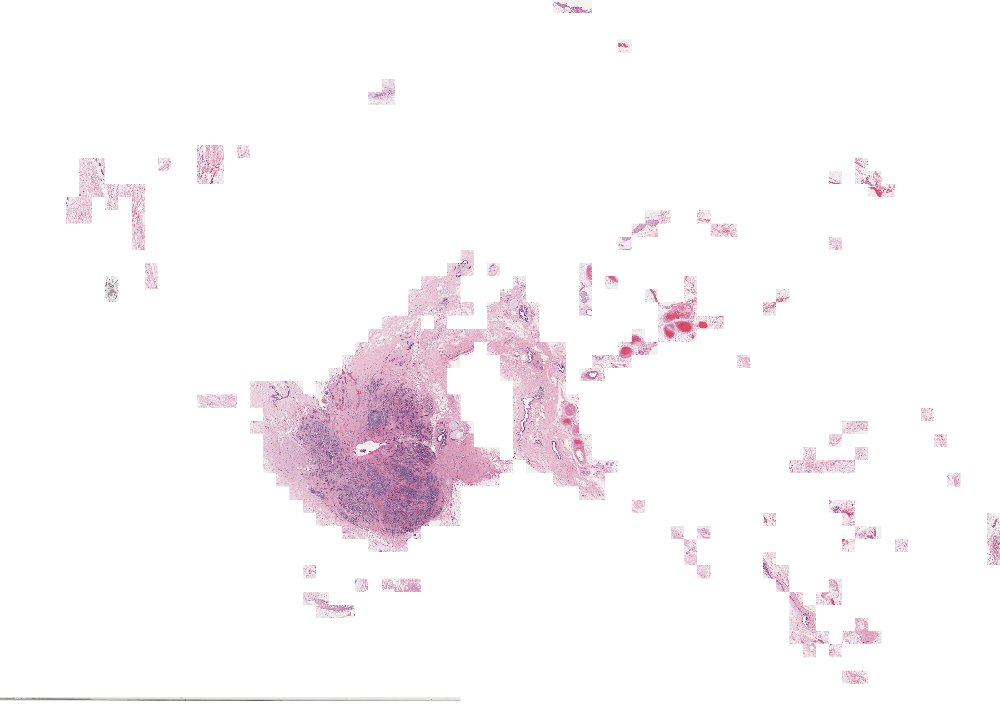

In [22]:
scale = 1
new_im.resize((int(total_width*scale), int(total_height*scale)))

## Patch Functions

In [0]:
def extractPatches(image, id, images, trg_attrib='img'):

  patches = []

  image_list = [img for img in images if img['id'] == id]

  min_x = min([img['x'] for img in image_list])
  max_x = max([img['x'] for img in image_list])
  min_y = min([img['y'] for img in image_list])
  max_y = max([img['y'] for img in image_list])

  for img in image_list:
    left = img['x'] - min_x
    upper = img['y']- min_y
    right = left + img['img'].size[0]
    bottom = upper + img['img'].size[1]
    patch = image.crop((left, upper, right, bottom))
    
    img[trg_attrib] = patch




# Stitch patches that belong to one ID  
def getImage(images, id, scale=0.25, border_width=1, mark_cancer=True, img_attrib='img'):
  image_list = [img for img in images if img['id'] == id]

  min_x = min([img['x'] for img in image_list])
  max_x = max([img['x'] for img in image_list])
  min_y = min([img['y'] for img in image_list])
  max_y = max([img['y'] for img in image_list])

  total_width = (max_x - min_x + patch_size)
  total_height = (max_y - min_y + patch_size)

  new_img = Image.new('RGB', (total_width, total_height), color=(255,255,255))

  # for img in [i for i in image_list]: 
  #   new_img.paste(img['img'], (img['x'] - min_x ,img['y']-min_y))


  for img in image_list:
      baseImage = img[img_attrib]

      if mark_cancer:
        if img['class'] == '1':
          class_img = Image.new('RGB', baseImage.size, color=(0,255,0))
          mask = Image.new("L", baseImage.size, 180)
          im = Image.composite(baseImage, class_img, mask)
        else:
          class_img = Image.new('RGB', baseImage.size, color=(255,255,255))
          mask = Image.new("L", baseImage.size, 255)
          im = Image.composite(baseImage, class_img, mask)
      else:
          im = baseImage
        
      bimg = ImageOps.expand(im, border=(border_width, border_width), fill=(0,0,0))
      
      new_img.paste(bimg, (img['x'] - min_x ,img['y']-min_y))


  return new_img.resize((int(total_width*scale), int(total_height*scale)))
  

## View whole slide

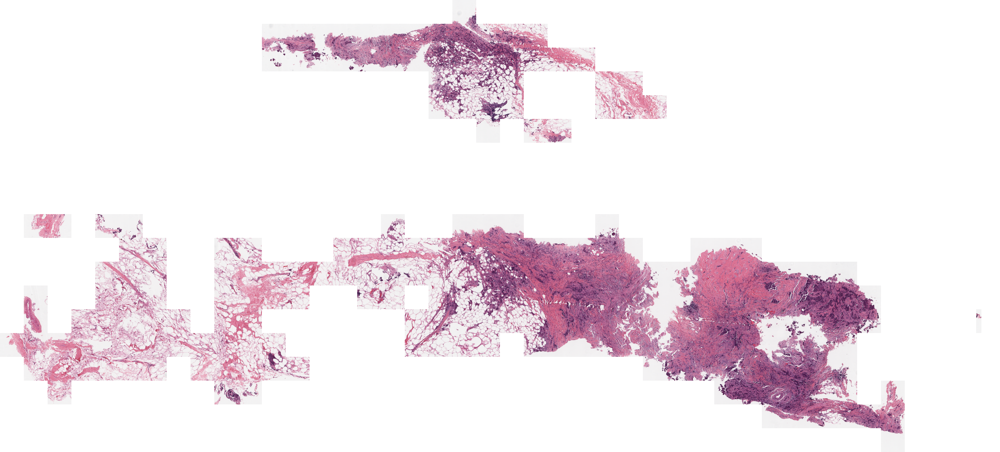

In [24]:
getImage(images, '13023', scale=1, border_width=0, mark_cancer=False)

## View sample slides

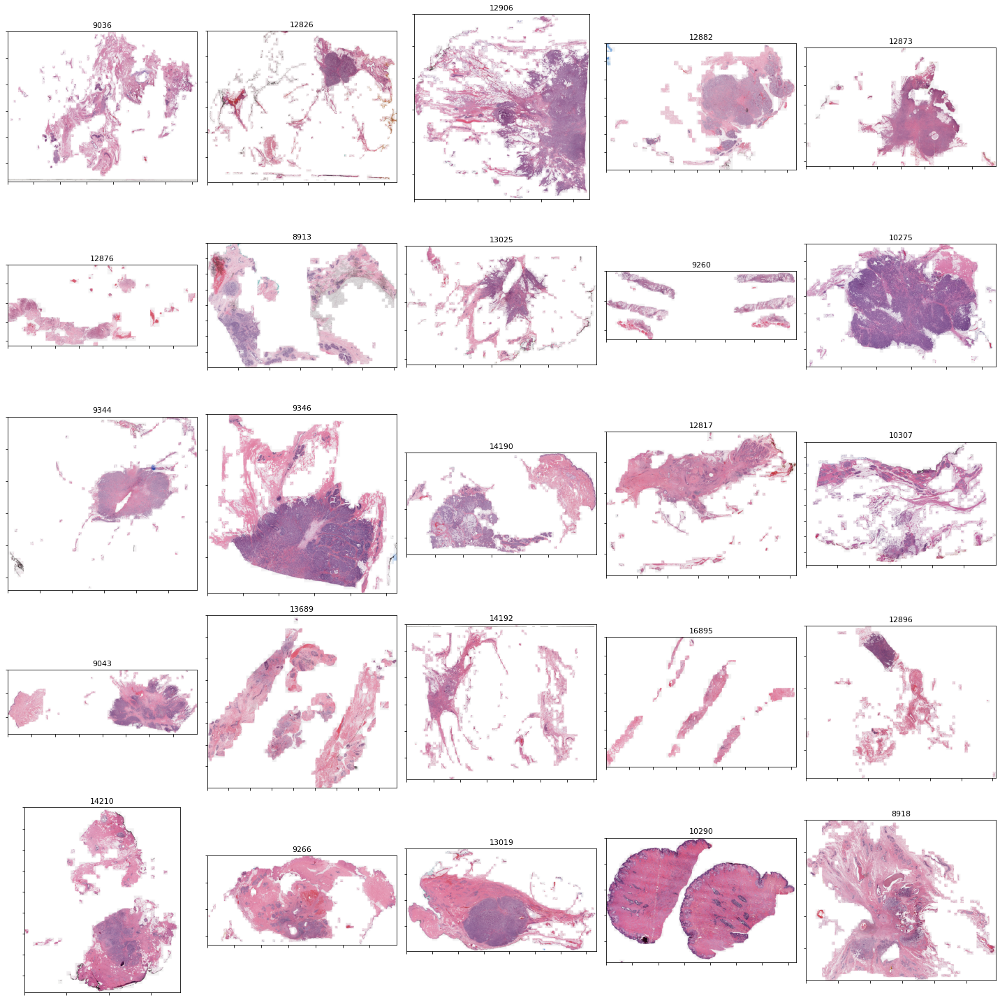

In [25]:
rdm_size = 25
num_fig = 5

np.random.seed(3)
rdm_id_list =  np.random.choice(ids, rdm_size, replace=False)

fig, axes = plt.subplots(num_fig, num_fig, figsize=(20,20))



for i, id in enumerate(rdm_id_list,):
  col = i % num_fig
  row = int(i / num_fig) 

  img = getImage(images, id, scale=1, border_width=0, mark_cancer=False)
  axes[row][col].set_title(id, fontsize=11 )
  axes[row][col].imshow(img)
  axes[row][col].xaxis.set_ticklabels([])
  axes[row][col].yaxis.set_ticklabels([])
  # axes[row][col].axis('off')

plt.tight_layout()


# Stain Colour Normalization
Reference: https://github.com/wanghao14/Stain_Normalization


In [0]:
def read_image(path):
  """
  Read an image to RGB uint8
  :param path:
  :return:
  """
  im = cv.imread(path)
  im = cv.cvtColor(im, cv.COLOR_BGR2RGB)
  return im


def show_colors(C):
  """
  Shows rows of C as colors (RGB)
  :param C:
  :return:
  """
  n = C.shape[0]
  for i in range(n):
      if C[i].max() > 1.0:
          plt.plot([0, 1], [n - 1 - i, n - 1 - i], c=C[i] / 255, linewidth=20)
      else:
          plt.plot([0, 1], [n - 1 - i, n - 1 - i], c=C[i], linewidth=20)
      plt.axis('off')
      plt.axis([0, 1, -1, n])


def show(image, now=True, fig_size=(10, 10)):
  """
  Show an image (np.array).
  Caution! Rescales image to be in range [0,1].
  :param image:
  :param now:
  :param fig_size:
  :return:
  """
  image = image.astype(np.float32)
  m, M = image.min(), image.max()
  if fig_size != None:
      plt.rcParams['figure.figsize'] = (fig_size[0], fig_size[1])
  plt.imshow((image - m) / (M - m), cmap='gray')
  plt.axis('off')
  if now == True:
      plt.show()


def build_stack(tup):
  """
  Build a stack of images from a tuple of images
  :param tup:
  :return:
  """
  N = len(tup)
  if len(tup[0].shape) == 3:
      h, w, c = tup[0].shape
      stack = np.zeros((N, h, w, c))
  if len(tup[0].shape) == 2:
      h, w = tup[0].shape
      stack = np.zeros((N, h, w))
  for i in range(N):
      stack[i] = tup[i]
  return stack


def patch_grid(ims, width=5, sub_sample=None, rand=False, save_name=None):
  """
  Display a grid of patches
  :param ims:
  :param width:
  :param sub_sample:
  :param rand:
  :return:
  """
  N0 = np.shape(ims)[0]
  if sub_sample == None:
      N = N0
      stack = ims
  elif sub_sample != None and rand == False:
      N = sub_sample
      stack = ims[:N]
  elif sub_sample != None and rand == True:
      N = sub_sample
      idx = np.random.choice(range(N), sub_sample, replace=False)
      stack = ims[idx]
  height = np.ceil(float(N) / width).astype(np.uint16)
  plt.rcParams['figure.figsize'] = (18, (18 / width) * height)
  plt.figure()
  for i in range(N):
      plt.subplot(height, width, i + 1)
      im = stack[i]
      show(im, now=False, fig_size=None)
  if save_name != None:
      plt.savefig(save_name)
  plt.show()


######################################

def standardize_brightness(I):
  """
  :param I:
  :return:
  """
  p = np.percentile(I, 90)
  return np.clip(I * 255.0 / p, 0, 255).astype(np.uint8)


def remove_zeros(I):
  """
  Remove zeros, replace with 1's.
  :param I: uint8 array
  :return:
  """
  mask = (I == 0)
  I[mask] = 1
  return I


def RGB_to_OD(I):
  """
  Convert from RGB to optical density
  :param I:
  :return:
  """
  I = remove_zeros(I)
  return -1 * np.log(I / 255)


def OD_to_RGB(OD):
  """
  Convert from optical density to RGB
  :param OD:
  :return:
  """
  return (255 * np.exp(-1 * OD)).astype(np.uint8)


def normalize_rows(A):
  """
  Normalize rows of an array
  :param A:
  :return:
  """
  return A / np.linalg.norm(A, axis=1)[:, None]


def notwhite_mask(I, thresh=0.8):
  """
  Get a binary mask where true denotes 'not white'
  :param I:
  :param thresh:
  :return:
  """
  I_LAB = cv.cvtColor(I, cv.COLOR_RGB2LAB)
  L = I_LAB[:, :, 0] / 255.0
  return (L < thresh)


def sign(x):
  """
  Returns the sign of x
  :param x:
  :return:
  """
  if x > 0:
      return +1
  elif x < 0:
      return -1
  elif x == 0:
      return 0


def get_concentrations(I, stain_matrix, lamda=0.01):
  """
  Get concentrations, a npix x 2 matrix
  :param I:
  :param stain_matrix: a 2x3 stain matrix
  :return:
  """
  OD = RGB_to_OD(I).reshape((-1, 3))
  return spams.lasso(OD.T, D=stain_matrix.T, mode=2, lambda1=lamda, pos=True).toarray().T

def get_stain_matrix(I, beta=0.15, alpha=1):
  """
  Get stain matrix (2x3)
  :param I:
  :param beta:
  :param alpha:
  :return:
  """
  OD = RGB_to_OD(I).reshape((-1, 3))
  OD = (OD[(OD > beta).any(axis=1), :])
  _, V = np.linalg.eigh(np.cov(OD, rowvar=False))
  V = V[:, [2, 1]]
  if V[0, 0] < 0: V[:, 0] *= -1
  if V[0, 1] < 0: V[:, 1] *= -1
  That = np.dot(OD, V)
  phi = np.arctan2(That[:, 1], That[:, 0])
  minPhi = np.percentile(phi, alpha)
  maxPhi = np.percentile(phi, 100 - alpha)
  v1 = np.dot(V, np.array([np.cos(minPhi), np.sin(minPhi)]))
  v2 = np.dot(V, np.array([np.cos(maxPhi), np.sin(maxPhi)]))
  if v1[0] > v2[0]:
      HE = np.array([v1, v2])
  else:
      HE = np.array([v2, v1])
  return normalize_rows(HE)


###

class Normalizer(object):
    """
    A stain normalization object
    """

    def __init__(self):
        self.stain_matrix_target = None
        self.target_concentrations = None
        
    def fit_image(self, target):
        self.fit(np.asarray(target))

    def fit(self, target):
        target = standardize_brightness(target)
        self.stain_matrix_target = get_stain_matrix(target)
        self.target_concentrations = get_concentrations(target, self.stain_matrix_target)

    def target_stains(self):
        return OD_to_RGB(self.stain_matrix_target)

    def transform(self, I):
        I = standardize_brightness(I)
        stain_matrix_source = get_stain_matrix(I)
        source_concentrations = get_concentrations(I, stain_matrix_source)
        maxC_source = np.percentile(source_concentrations, 99, axis=0).reshape((1, 2))
        maxC_target = np.percentile(self.target_concentrations, 99, axis=0).reshape((1, 2))
        source_concentrations *= (maxC_target / maxC_source)
        return (255 * np.exp(-1 * np.dot(source_concentrations, self.stain_matrix_target).reshape(I.shape))).astype(
            np.uint8)
    
    def transform_image(self, I):
        t = self.transform(np.asarray(I))
        return Image.fromarray(t, mode='RGB')

    def hematoxylin(self, I):
        I = standardize_brightness(I)
        h, w, c = I.shape
        stain_matrix_source = get_stain_matrix(I)
        source_concentrations = get_concentrations(I, stain_matrix_source)
        H = source_concentrations[:, 0].reshape(h, w)
        H = np.exp(-1 * H)
        return H

In [0]:

n=Normalizer()  #Macenko normalization


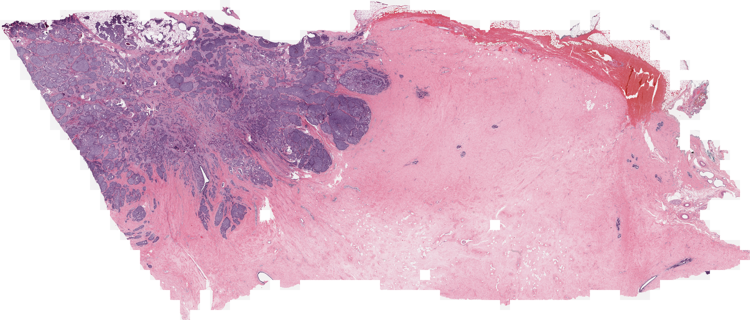

In [28]:
#pick an slide as the targe
base_id = '12910'
targetImage = getImage(images, base_id, scale=1, border_width=0, mark_cancer=False )

#view the slide
scale = 0.2
targetImage.resize((int(targetImage.size[0]*scale), int(targetImage.size[1]*scale)))

In [0]:
n.fit_image(targetImage)

In [0]:
patches = [img['img'] for img in images if img['id'] == '10253']

In [31]:
images[0]

{'class': '0',
 'file': '12893_idx5_x1001_y1101_class0.png',
 'id': '12893',
 'img': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=50x50 at 0x7FA0408902E8>,
 'x': 1001,
 'y': 1101}

## Normalize all images and extract patches

In [39]:
images_norm = images.copy()


#get all IDs
ids = np.unique([img['id'] for img in images])
print('Num IDs:{0}'.format(len(ids)))
count = 1 
  
for id in ids: 
  print('processing id:{0}'.format(id))
  start_time =  time.time()
  targetImage = getImage(images, id, scale=1, border_width=0, mark_cancer=False)
  
  if id != base_id:
    targetImage = n.transform_image(targetImage)

  extractPatches(targetImage, id, images_norm)

  end_time = time.time() 
  print('finished normalizing id:', id, ' total seconds:', (end_time - start_time), 'remaining images:', len(ids)-count)
  
  count += 1

# targetImage.resize((int(targetImage.size[0]*0.25), int(targetImage.size[1]*0.25)))

Num IDs:279
processing id:10253
finished normalizing id: 10253  total seconds: 3.2062206268310547 remaining images: 278
processing id:10254
finished normalizing id: 10254  total seconds: 4.025656700134277 remaining images: 277
processing id:10255
finished normalizing id: 10255  total seconds: 2.1722702980041504 remaining images: 276
processing id:10256
finished normalizing id: 10256  total seconds: 2.6334218978881836 remaining images: 275
processing id:10257
finished normalizing id: 10257  total seconds: 3.5814449787139893 remaining images: 274
processing id:10258
finished normalizing id: 10258  total seconds: 3.3111424446105957 remaining images: 273
processing id:10259
finished normalizing id: 10259  total seconds: 6.087008237838745 remaining images: 272
processing id:10260
finished normalizing id: 10260  total seconds: 5.494217395782471 remaining images: 271
processing id:10261
finished normalizing id: 10261  total seconds: 3.254725933074951 remaining images: 270
processing id:10262


In [0]:

binary_fldr = '/content/drive/Shared drives/Roger Chow/Dataset/IDC_regular_ps50_idx5_BIN/'
bin_file =  'IDC_regular_ps50_idx5_norm.p' 

pickle.dump( images_norm, open( binary_fldr + bin_file, "wb" ) )
  

In [0]:
patches[0]

## Transform single image

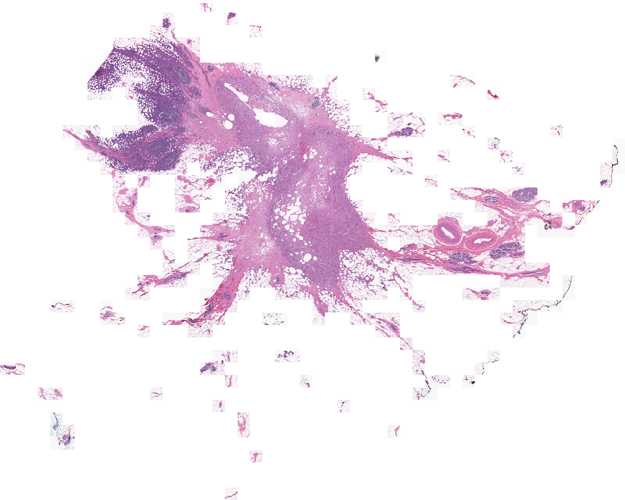

In [32]:
targetImage = getImage(images, '10253', scale=1, border_width=0, mark_cancer=False)
#view the slide
scale = 0.25
targetImage.resize((int(targetImage.size[0]*scale), int(targetImage.size[1]*scale)))

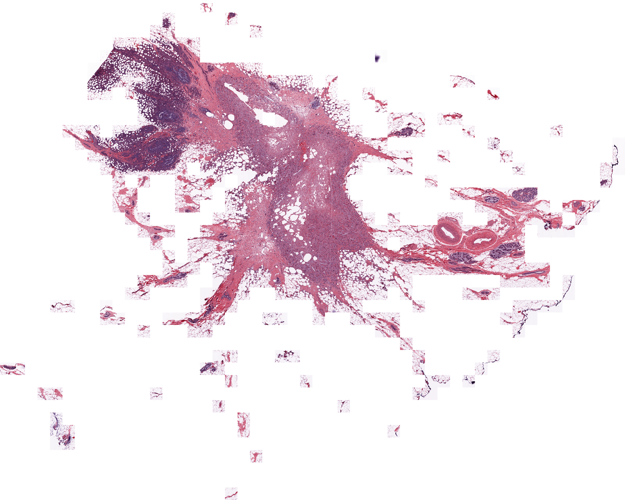

In [33]:
t = n.transform_image(targetImage)
t.resize((int(t.size[0]*.25), int(t.size[1]*0.25)))

#(int(total_width*scale), int(total_height*scale)))

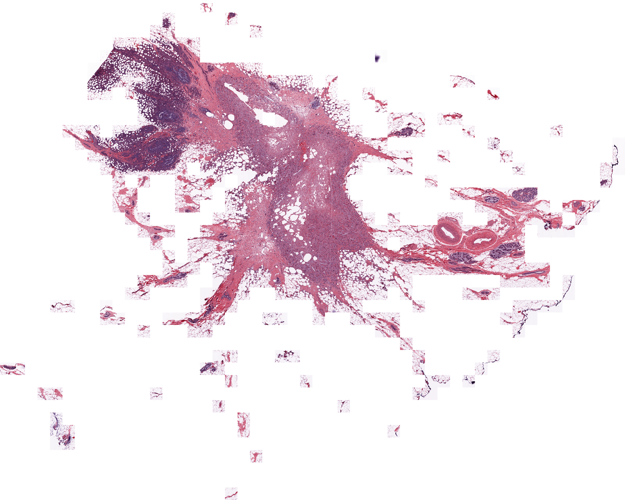

In [41]:
getImage(images_norm, '10253', scale=0.25, border_width=0, mark_cancer=False)

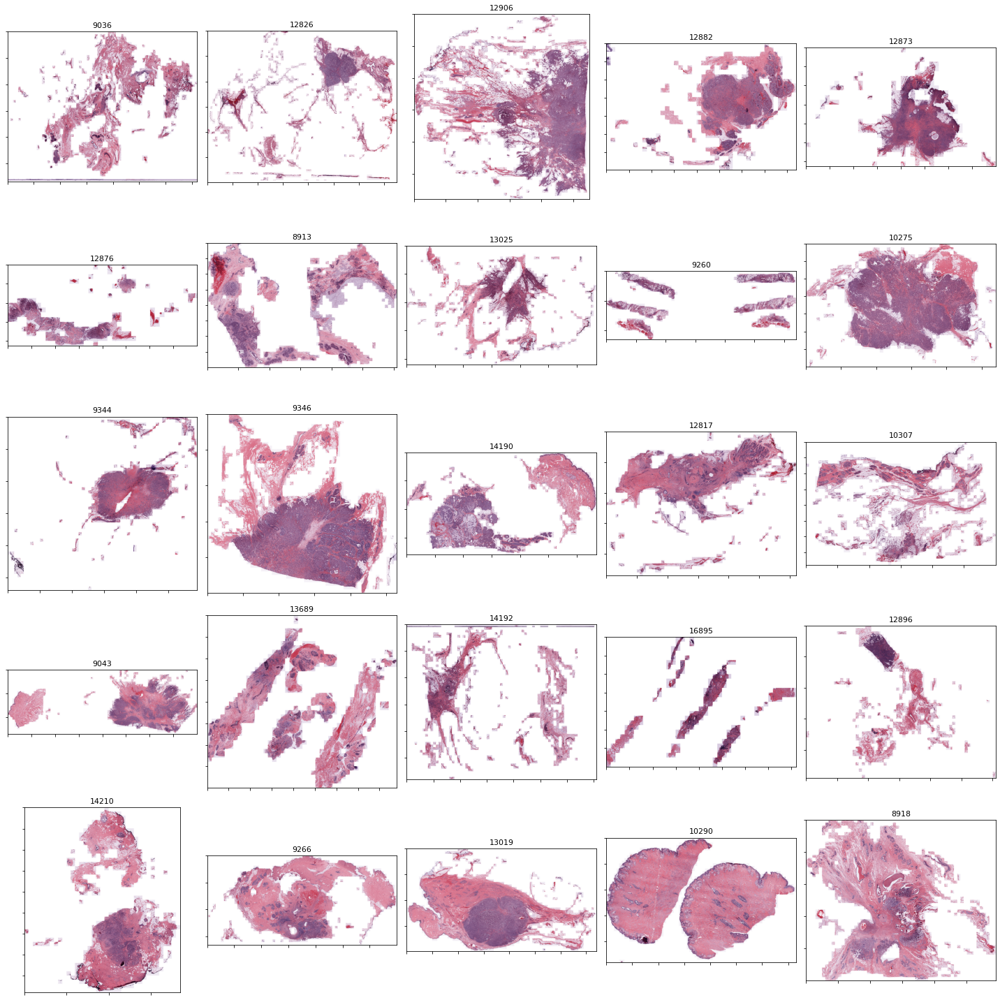

In [42]:
rdm_size = 25
num_fig = 5

np.random.seed(3)
rdm_id_list =  np.random.choice(ids, rdm_size, replace=False)

fig, axes = plt.subplots(num_fig, num_fig, figsize=(20,20))



for i, id in enumerate(rdm_id_list,):
  col = i % num_fig
  row = int(i / num_fig) 

  img = getImage(images_norm, id, scale=1, border_width=0, mark_cancer=False)
  axes[row][col].set_title(id, fontsize=11 )
  axes[row][col].imshow(img)
  axes[row][col].xaxis.set_ticklabels([])
  axes[row][col].yaxis.set_ticklabels([])
  # axes[row][col].axis('off')

plt.tight_layout()